In [9]:
import medleydb
import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import pandas as pd
import IPython.display as ipd

def play_audio(track):
    track_id = track.mix_path
    samples, sample_rate = librosa.load(track_id)
    ipd.display(ipd.Audio(samples, rate=sample_rate, autoplay=True))
    
def load_track(track_id):
    t_gen = utils.load_multitracks([track_id])
    return next(t_gen)

In [ ]:
from medleydb import utils
tracks = utils.load_all_multitracks(['V1', 'V2'])

count = 0 
for t in tracks: 
    count += 1 
    
print(count)

In [ ]:
#t_gen = utils.load_multitracks(['AClassicEducation_NightOwl'])
t_gen = utils.load_multitracks(['MusicDelta_Shadows'])
track = next(t_gen)

In [ ]:
help(track)

In [12]:
print(track.mix_path)
play_audio(load_track('JoelHelander_IntheAtticBedroom'))

/home/carlnys/data/medleydb/medleydb/Audio/MusicDelta_Shadows/MusicDelta_Shadows_MIX.wav


/home/carlnys/.local/lib/python3.7/site-packages/medleydb/multitrack.py:367: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  metadata = yaml.load(f_in)


In [ ]:
source_id_fpath# SR is 22050 by default, and it loads the file as mono by default as well.
y, sr = librosa.load(track.mix_path)
#y is simply an array of the samples in the track, to get a fixed number of seconds in the spectrogram,
#multiply the sr with the amount of seconds you want
#S = librosa.feature.melspectrogram(y=y[:sr], sr=sr, n_fft=sr//2, hop_length=sr//3)
# 22050 
hop_length = sr//10
S = librosa.feature.melspectrogram(y=y[:sr], sr=sr, n_fft=sr//5, hop_length=hop_length, n_mels=128)
print(S.shape)
#for i in range(3):
#    print(S[0][i])


In [ ]:
def _rms(y):
    return np.sqrt(np.mean(np.abs(y)**2, axis=0, keepdims=True))

In [16]:
# y is #samples in the song, spectrogram_len is in ms, to get number of samples per spectogram_len
# we need to convert the length to a ratio, based on sr
# sr = 22050 samples/s (by default), we want number samples/spectrogram_len 
# We want to take s = s_l/1000 and take sr*s 

# TODO: Save spectrograms to some folder which specifies length and track_ID

def preprocess_track(track, spectrogram_len=1, n_fft=2048, hop_length=512):
    y, sr = librosa.load(track.mix_path)
    samples_per_spectrogram = int(sr*spectrogram_len)
    print(samples_per_spectrogram)
    print(len(y)//samples_per_spectrogram)
    #remove samples that doesn't divide equally with s_p_s
    y = y[:(len(y)//samples_per_spectrogram)*samples_per_spectrogram]
    for i in range(0, len(y), samples_per_spectrogram):
        sound_bite = y[i:i+samples_per_spectrogram]
        #print("mean before: ", np.mean(sound_bite))
        #print("sum before:", sum(sound_bite))
        #rms = librosa.feature.rms(sound_bite, frame_length=samples_per_spectrogram,
        #                          hop_length=samples_per_spectrogram+1)[0][0]
        #print("librosa rms: ", rms)
        #print("manual rms: ", _rms(sound_bite))
        #sound_bite /= rms
        #print("mean after: ", np.mean(sound_bite))
        #print("sum after: ", sum(sound_bite))
        S = librosa.feature.melspectrogram(y=sound_bite, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=128)
        S_dB = librosa.power_to_db(S, ref=np.max)
        S_dB = S_dB.astype(np.float32)
        print(S_dB.shape)
        librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         hop_length=hop_length,
                         fmax=8000)
        plt.colorbar(format='%+2.0f dB')
        plt.title('Mel-frequency spectrogram')
        plt.tight_layout()
        plt.show()

In [ ]:
y, sr = librosa.load(track.mix_path)
y = y[:22050]
rmse = librosa.feature.rms(y, frame_length=22050, hop_length=22051)[0][0]
normalized_y = y/rmse

plt.subplot(2, 1, 1)
librosa.display.waveplot(y, sr=sr)
plt.title('Normalized vs. Unnormalized')
plt.ylabel('Unnormalized')
plt.subplot(2, 1, 2)
librosa.display.waveplot(normalized_y, sr=sr)
plt.ylabel('Normalized')
plt.show

22050
184
(128, 44)


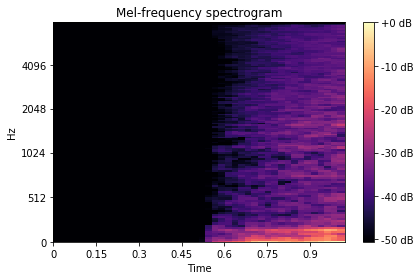

(128, 44)


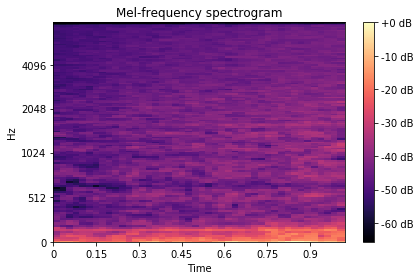

(128, 44)


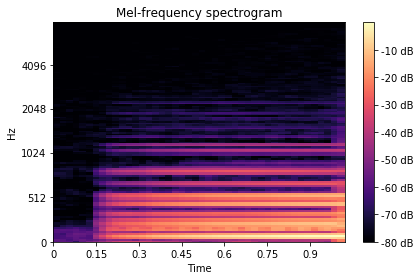

(128, 44)


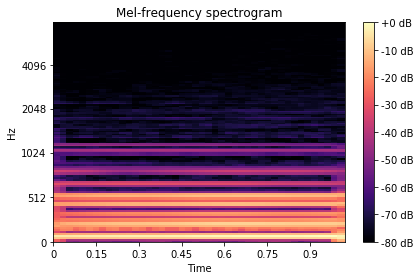

(128, 44)


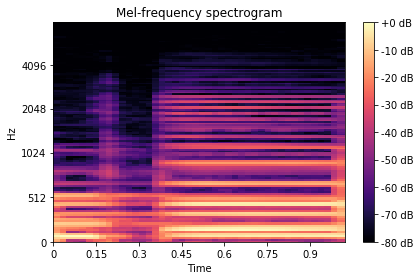

(128, 44)


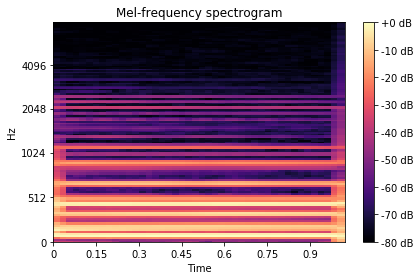

(128, 44)


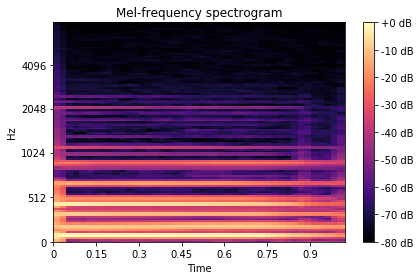

(128, 44)


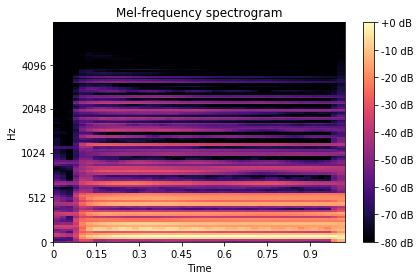

(128, 44)


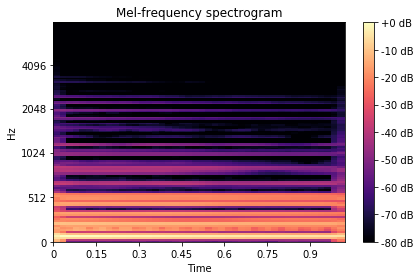

(128, 44)


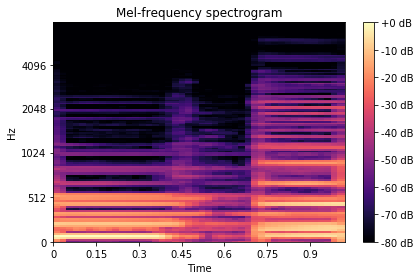

(128, 44)


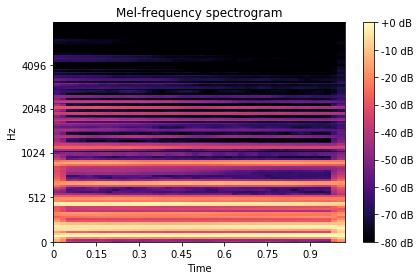

(128, 44)


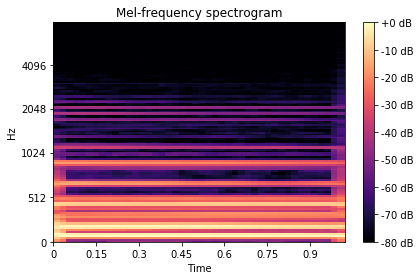

(128, 44)


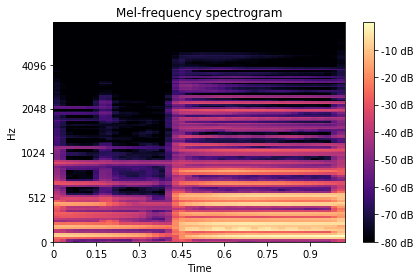

(128, 44)


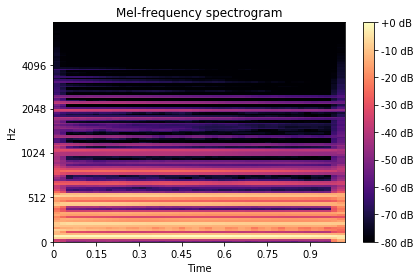

(128, 44)


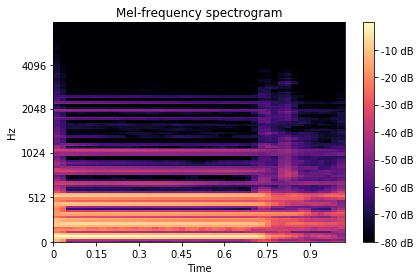

(128, 44)


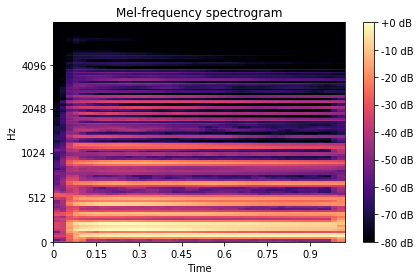

(128, 44)


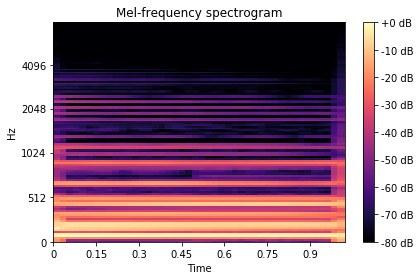

(128, 44)


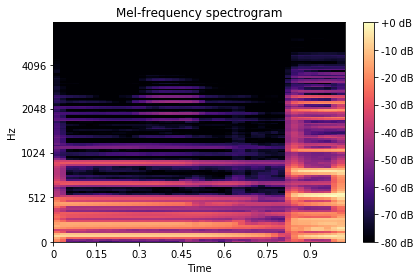

(128, 44)


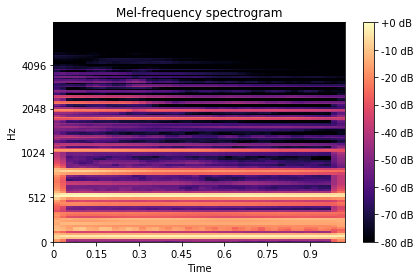

(128, 44)


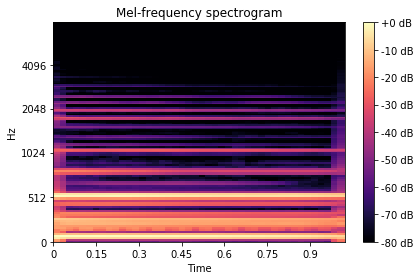

(128, 44)


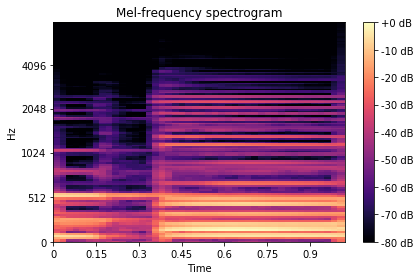

(128, 44)


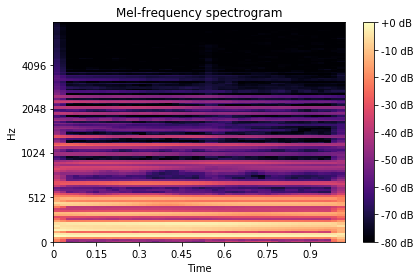

(128, 44)


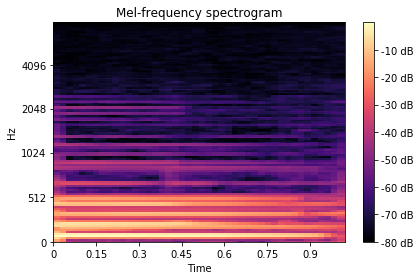

(128, 44)


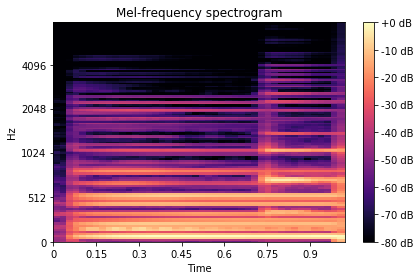

(128, 44)


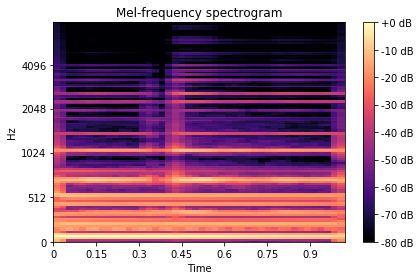

(128, 44)


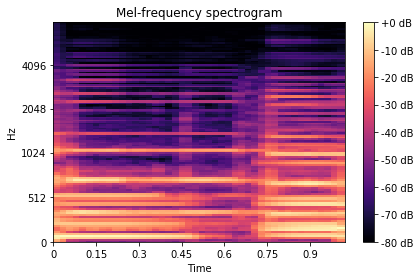

(128, 44)


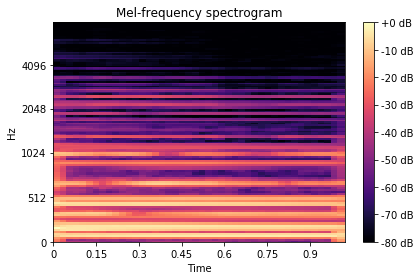

(128, 44)


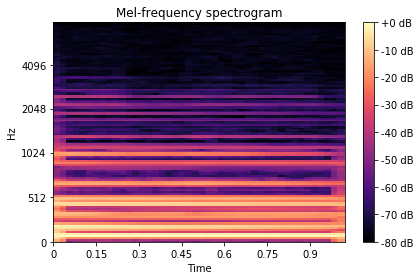

(128, 44)


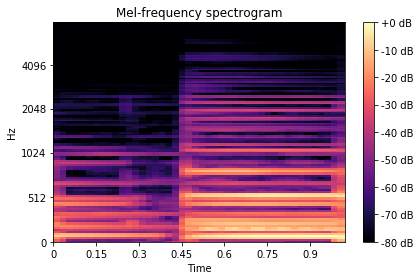

(128, 44)


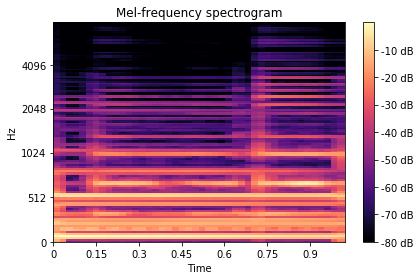

(128, 44)


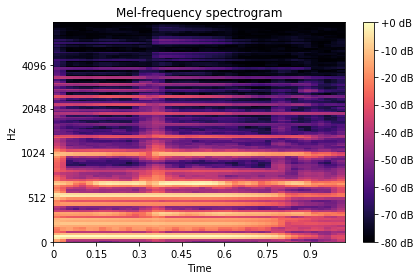

(128, 44)


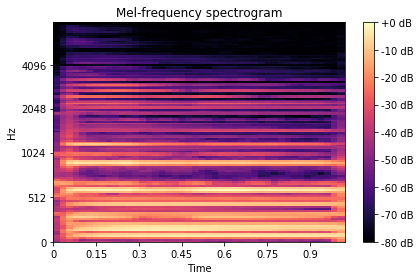

(128, 44)


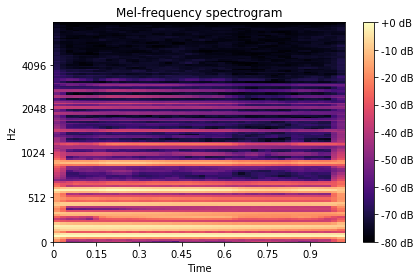

(128, 44)


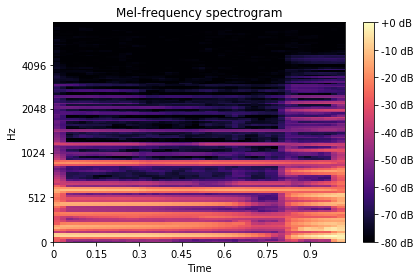

(128, 44)


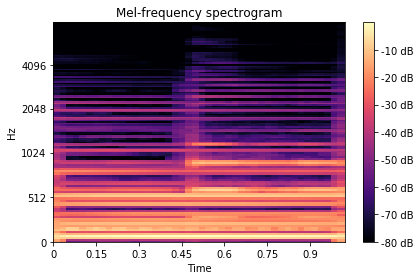

(128, 44)


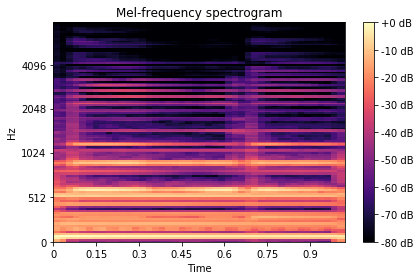

(128, 44)


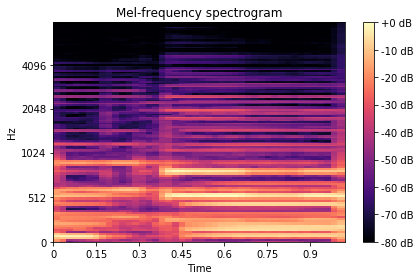

(128, 44)


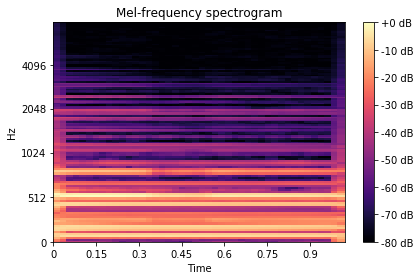

(128, 44)


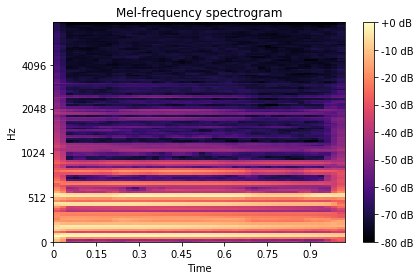

(128, 44)


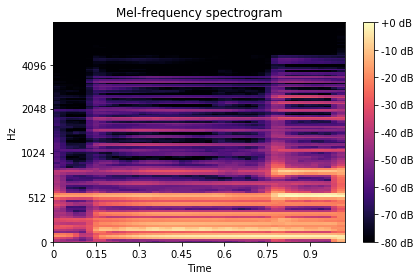

(128, 44)


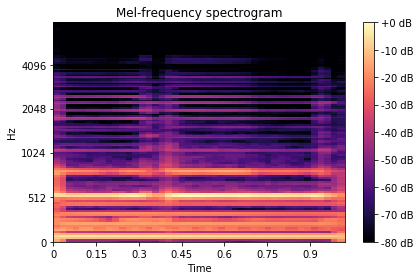

(128, 44)


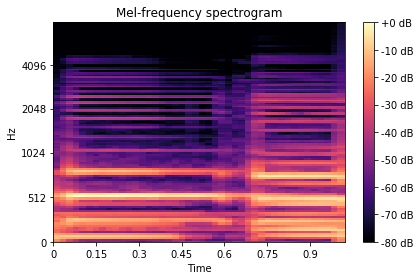

(128, 44)


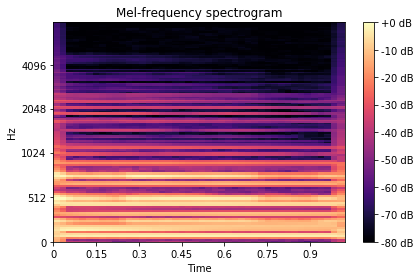

(128, 44)


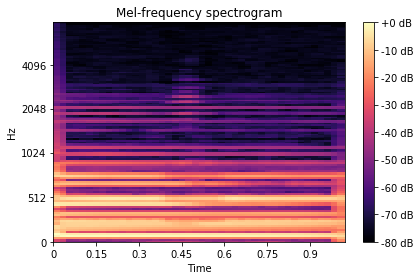

(128, 44)


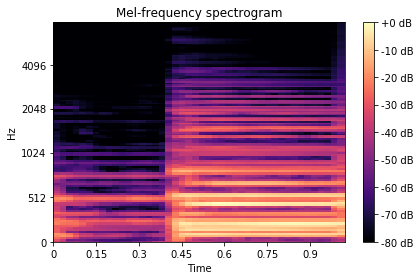

(128, 44)


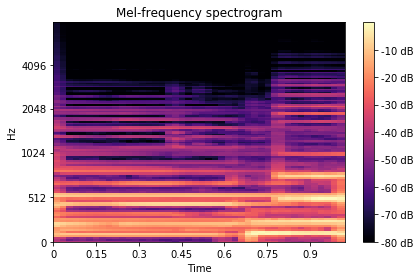

(128, 44)


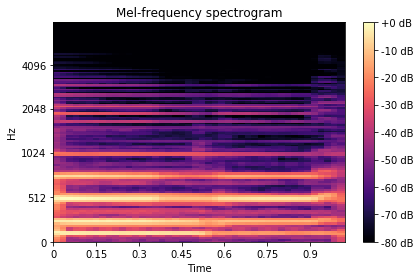

(128, 44)


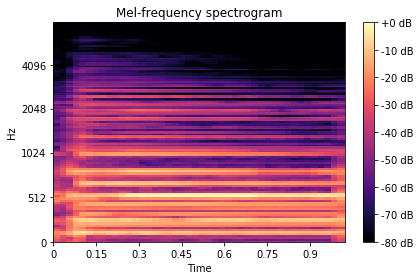

(128, 44)


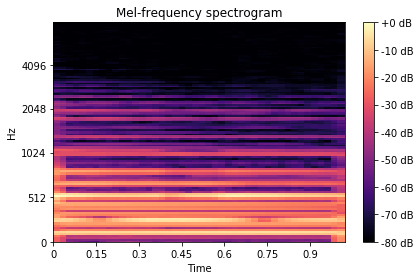

(128, 44)


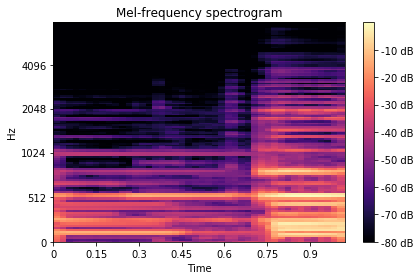

(128, 44)


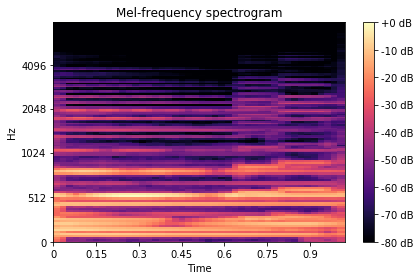

(128, 44)


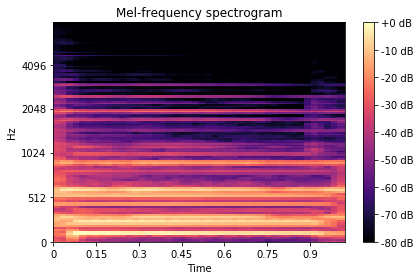

(128, 44)


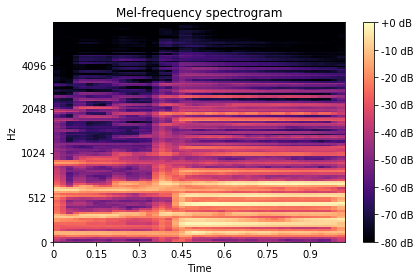

(128, 44)


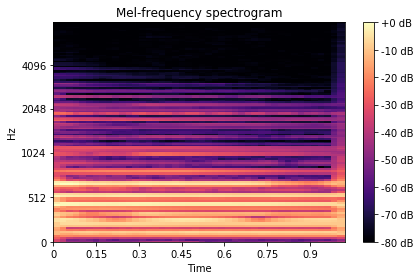

(128, 44)


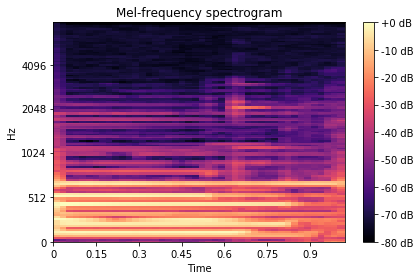

(128, 44)


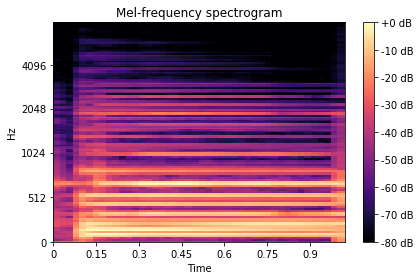

(128, 44)


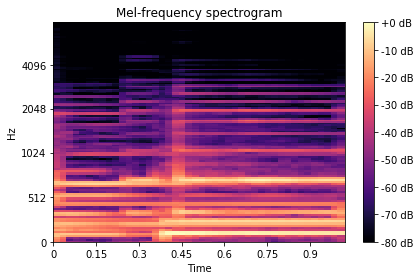

(128, 44)


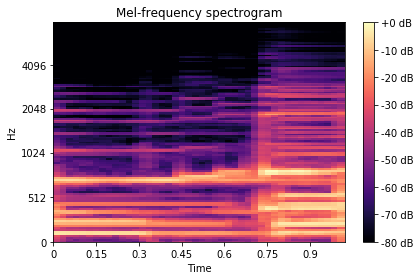

(128, 44)


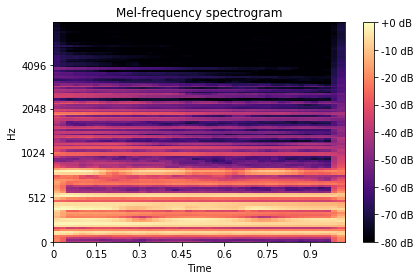

(128, 44)


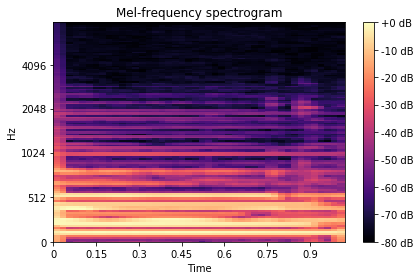

(128, 44)


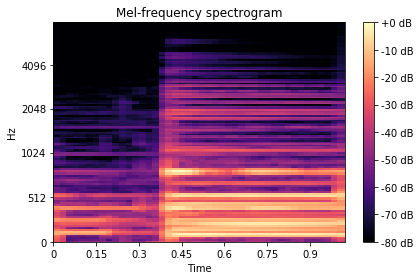

(128, 44)


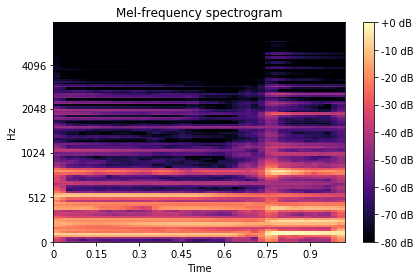

(128, 44)


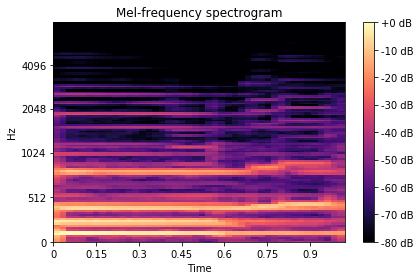

(128, 44)


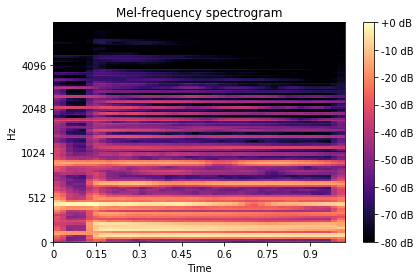

(128, 44)


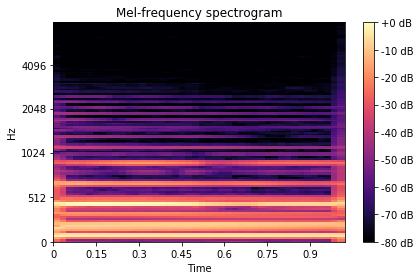

(128, 44)


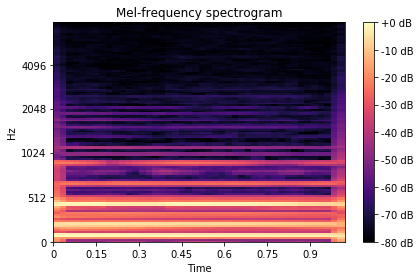

(128, 44)


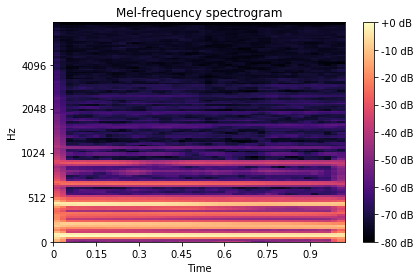

(128, 44)


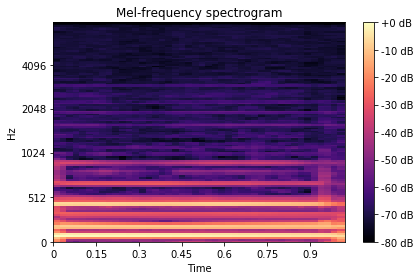

(128, 44)


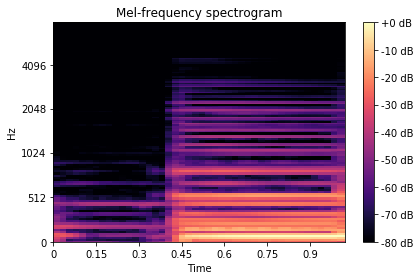

(128, 44)


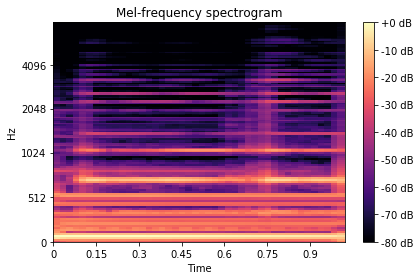

(128, 44)


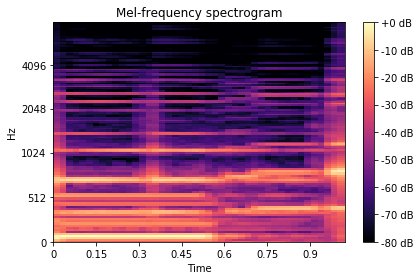

(128, 44)


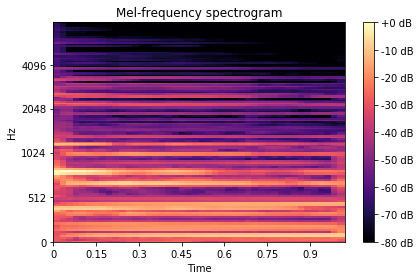

(128, 44)


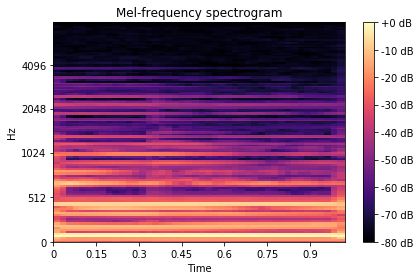

(128, 44)


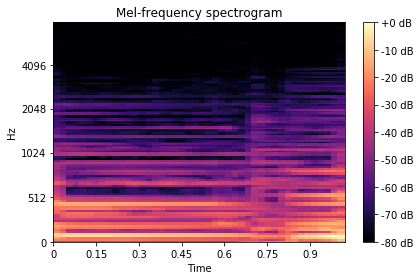

(128, 44)


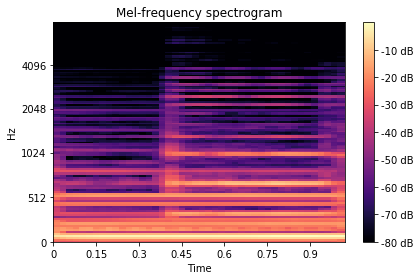

(128, 44)


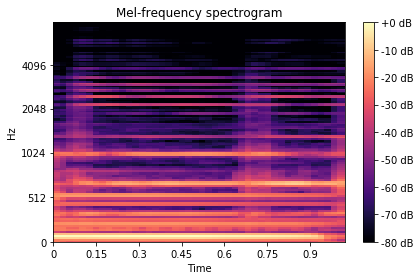

(128, 44)


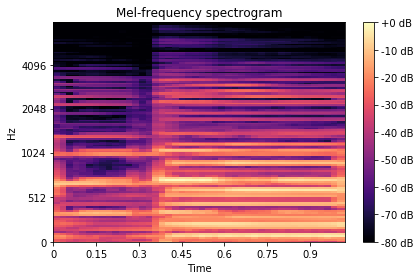

(128, 44)


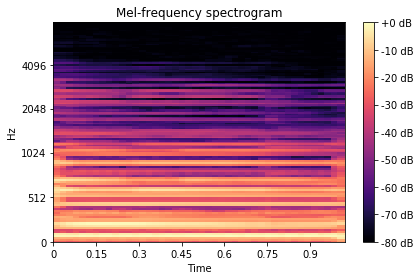

(128, 44)


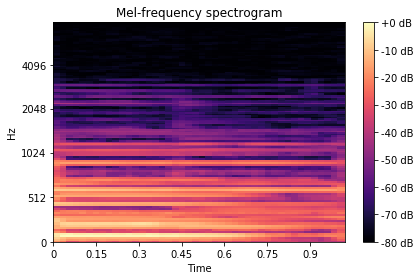

(128, 44)


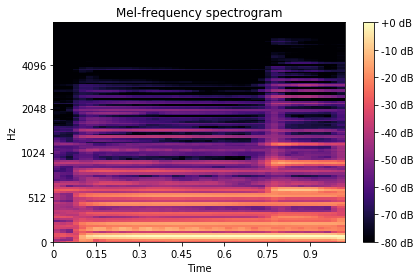

(128, 44)


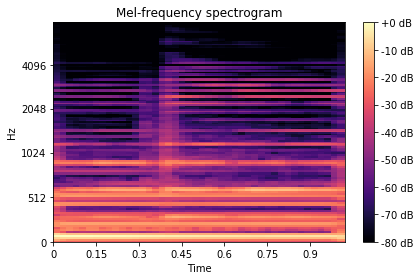

(128, 44)


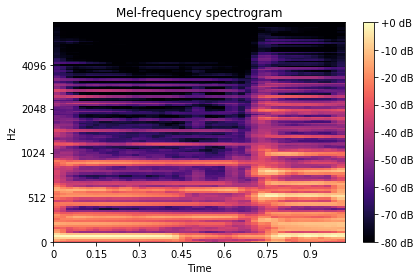

(128, 44)


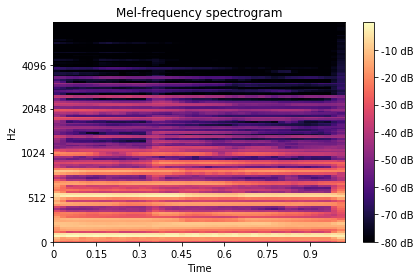

(128, 44)


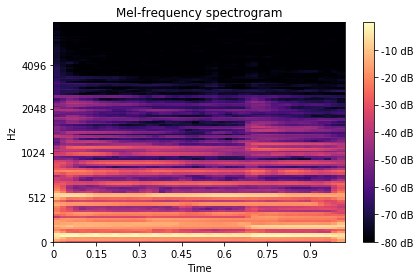

(128, 44)


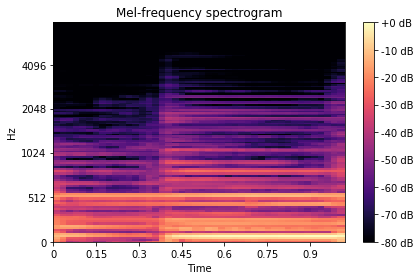

(128, 44)


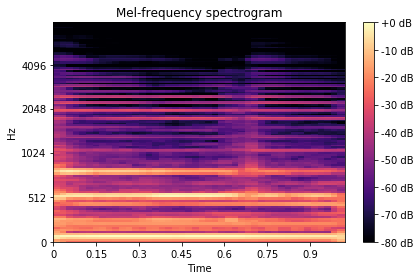

(128, 44)


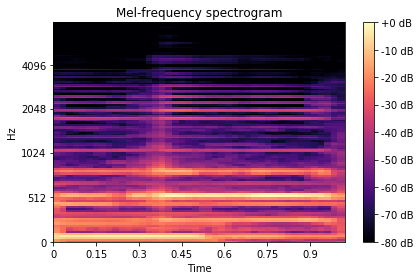

(128, 44)


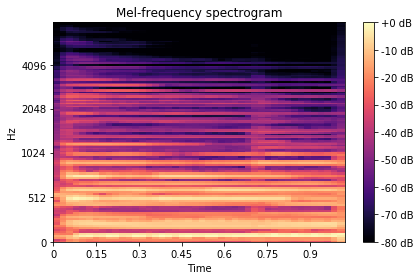

(128, 44)


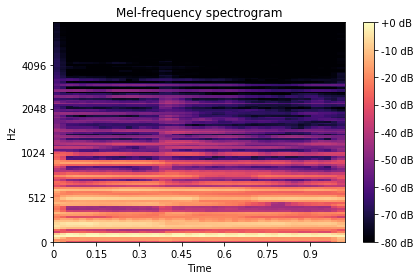

(128, 44)


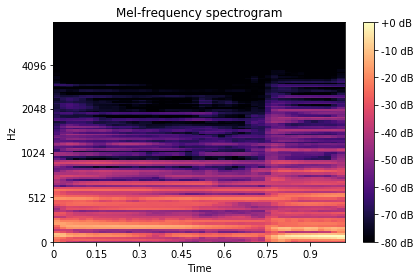

(128, 44)


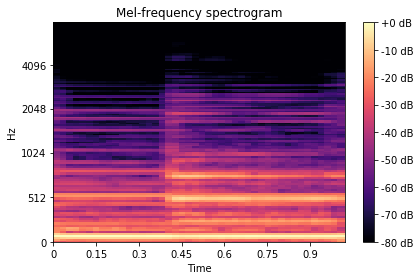

(128, 44)


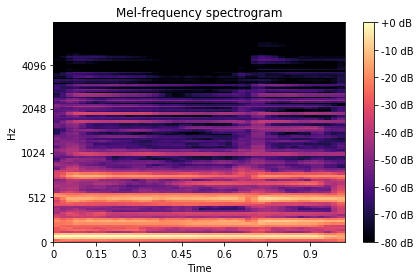

(128, 44)


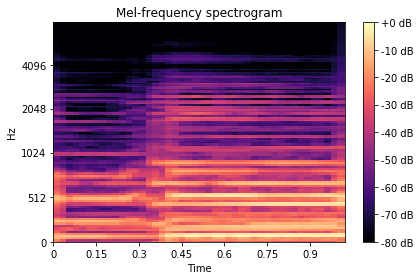

(128, 44)


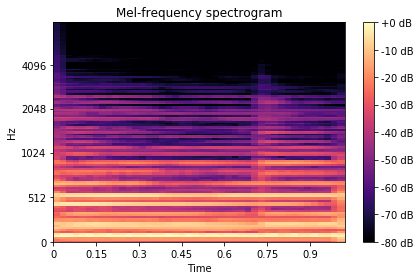

(128, 44)


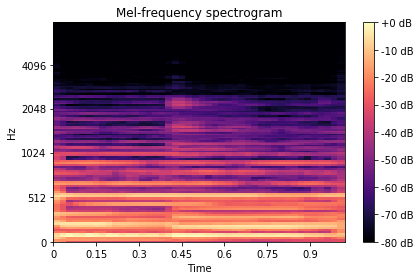

(128, 44)


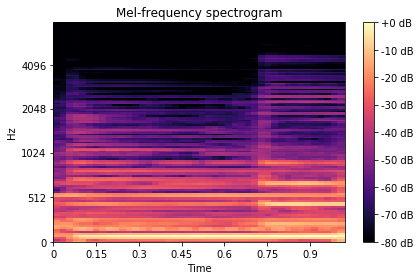

(128, 44)


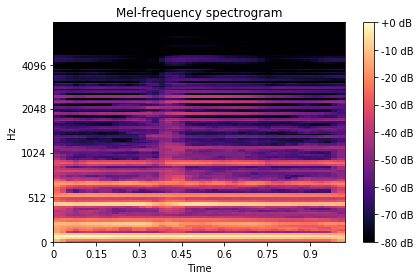

(128, 44)


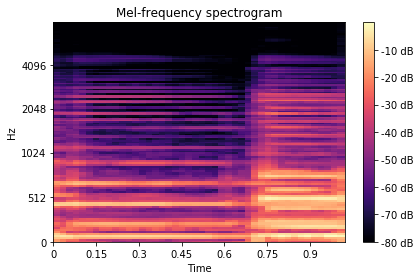

(128, 44)


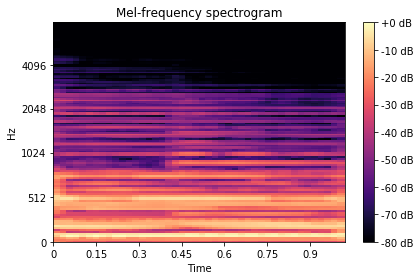

(128, 44)


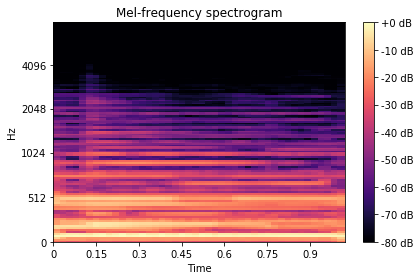

(128, 44)


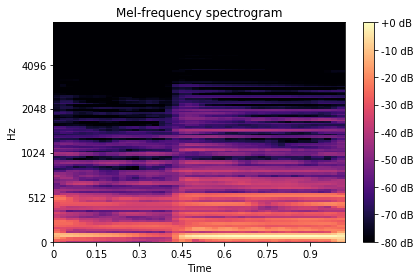

(128, 44)


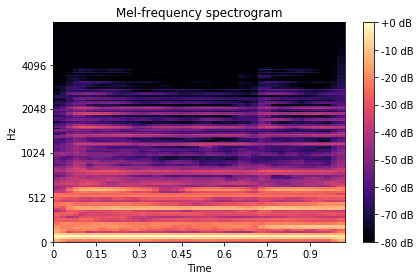

(128, 44)


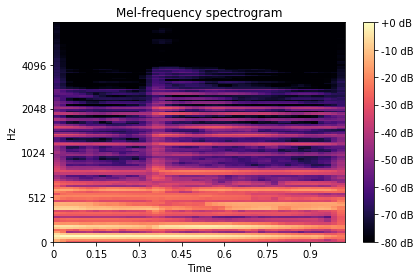

(128, 44)


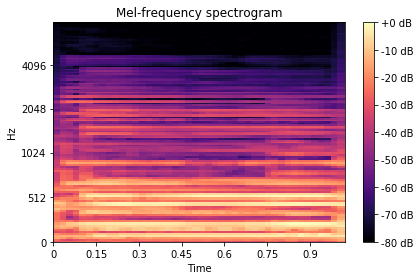

(128, 44)


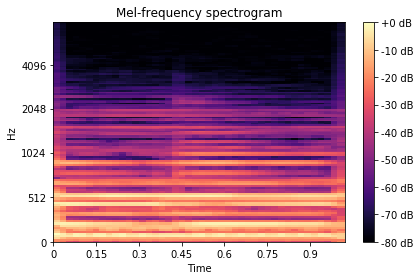

(128, 44)


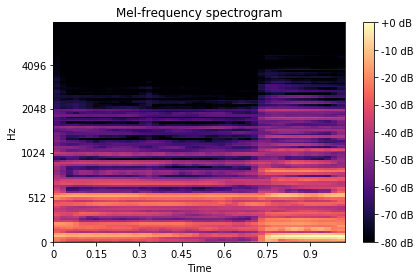

(128, 44)


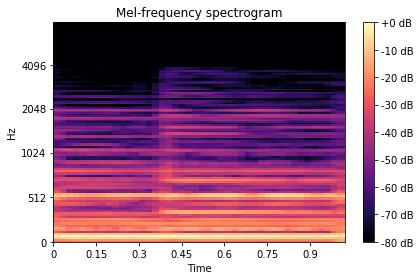

(128, 44)


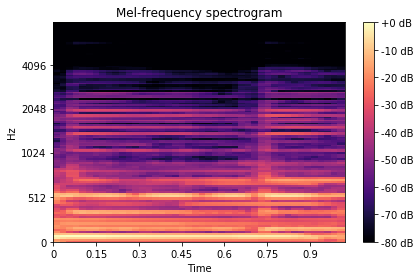

(128, 44)


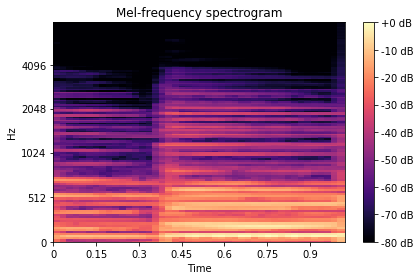

(128, 44)


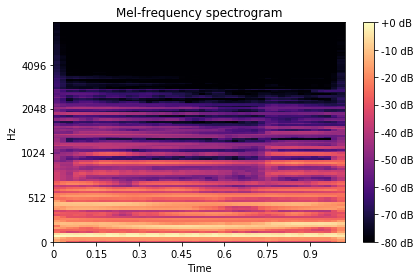

(128, 44)


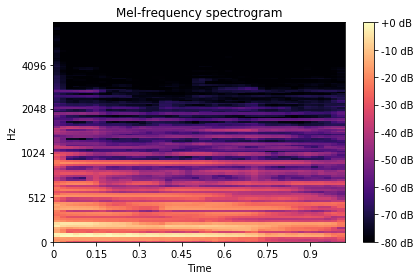

(128, 44)


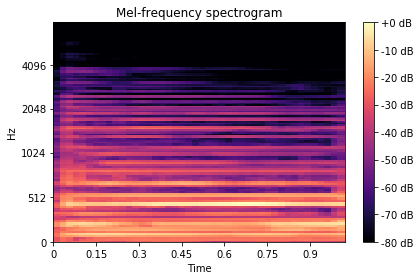

(128, 44)


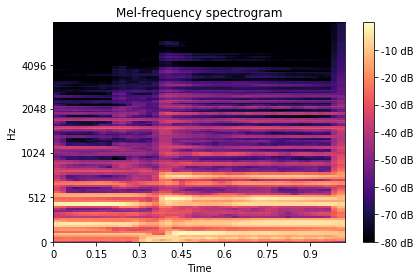

(128, 44)


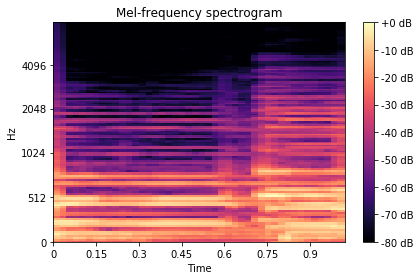

(128, 44)


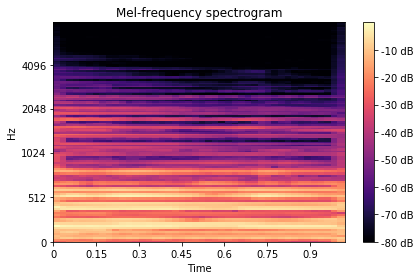

(128, 44)


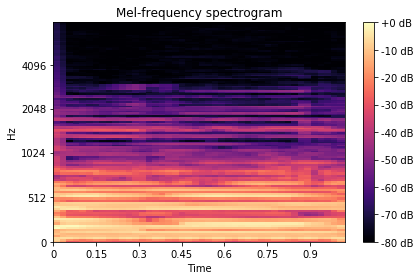

(128, 44)


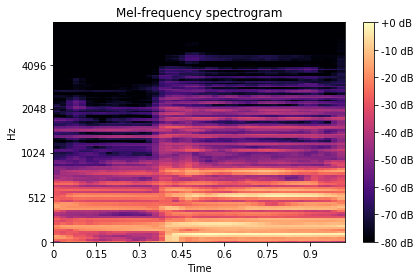

(128, 44)


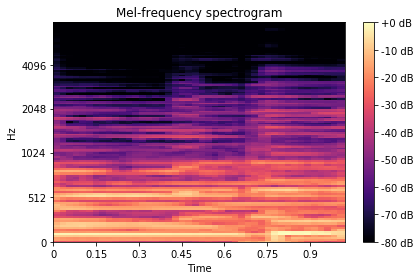

(128, 44)


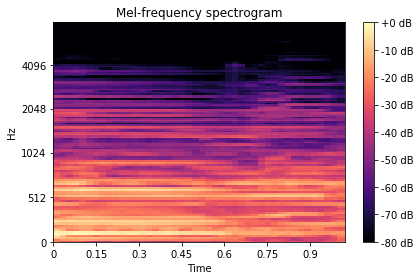

(128, 44)


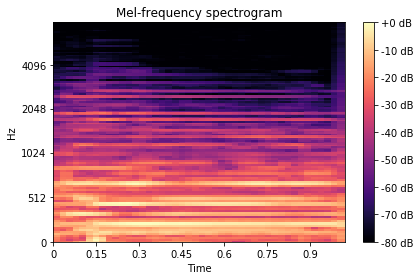

(128, 44)


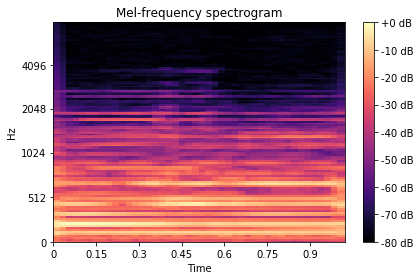

(128, 44)


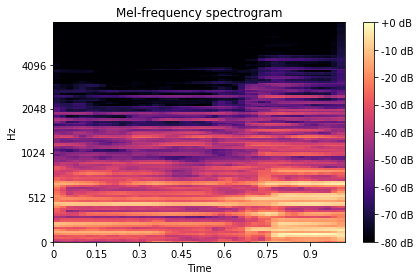

(128, 44)


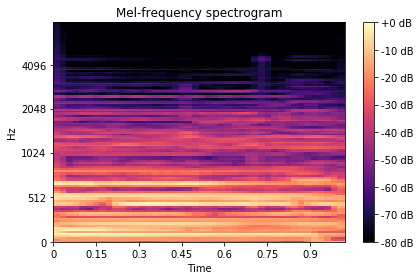

(128, 44)


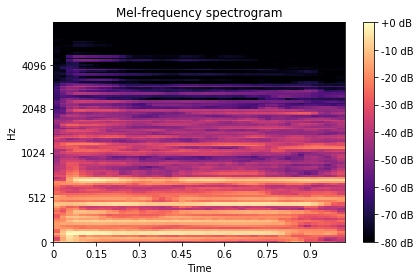

(128, 44)


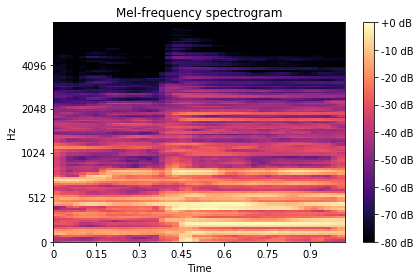

(128, 44)


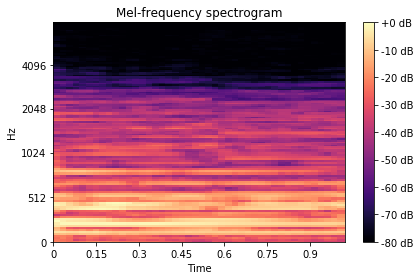

(128, 44)


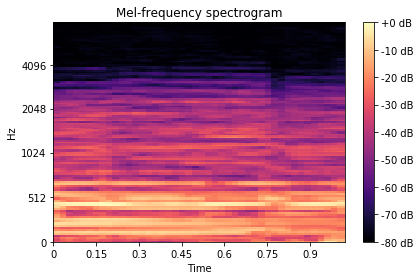

(128, 44)


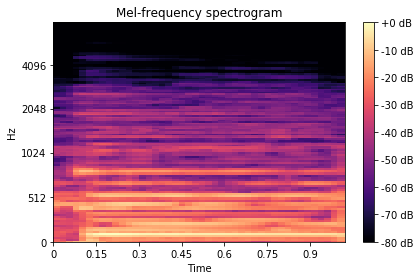

(128, 44)


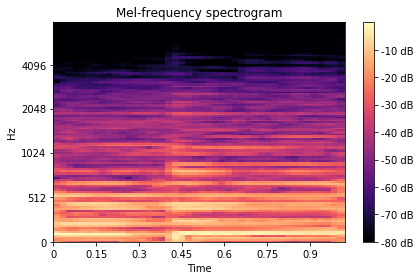

(128, 44)


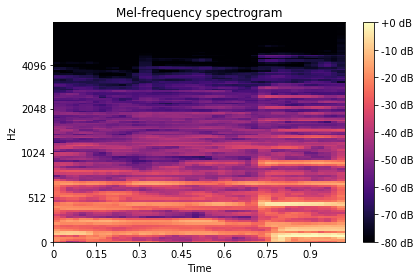

(128, 44)


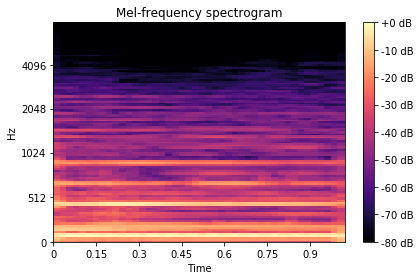

(128, 44)


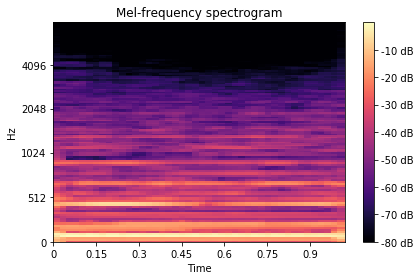

(128, 44)


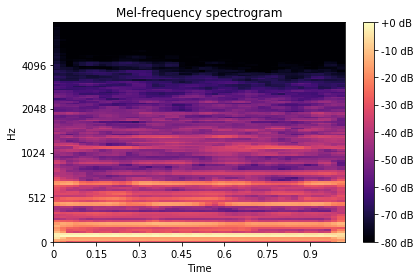

(128, 44)


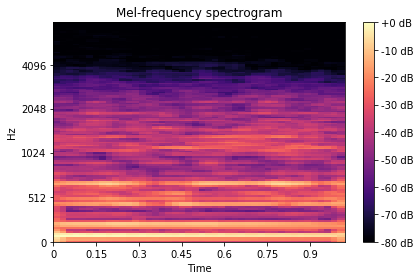

(128, 44)


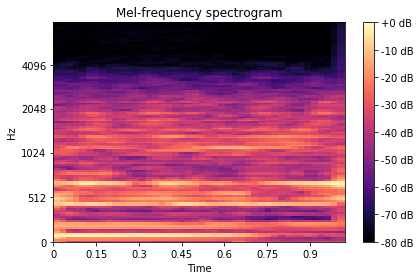

(128, 44)


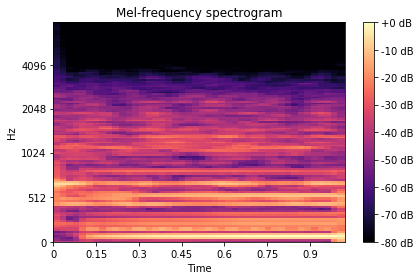

(128, 44)


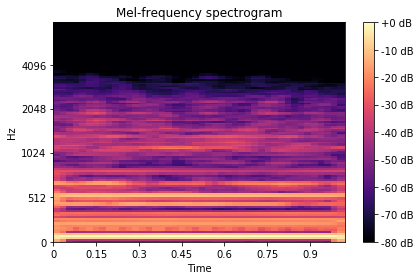

(128, 44)


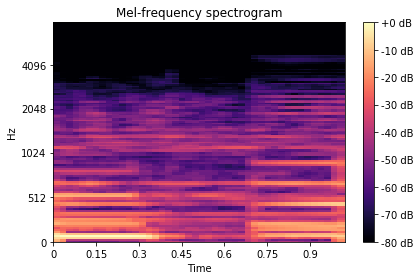

(128, 44)


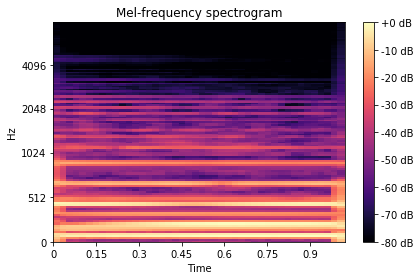

(128, 44)


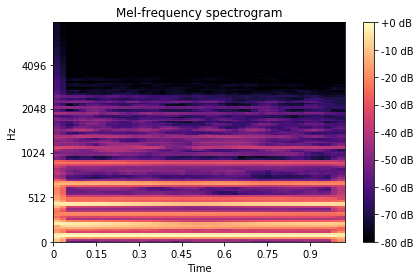

(128, 44)


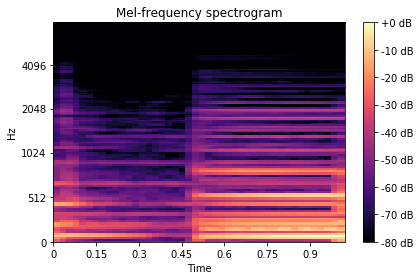

(128, 44)


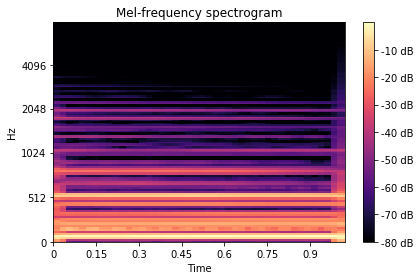

(128, 44)


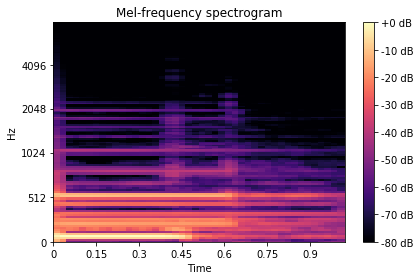

(128, 44)


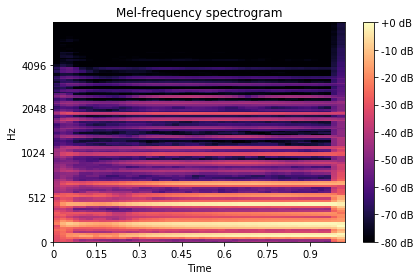

(128, 44)


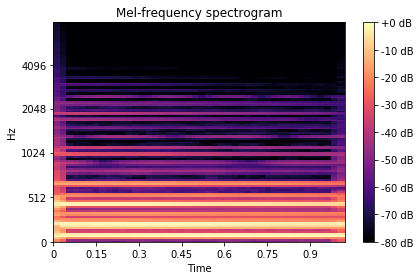

(128, 44)


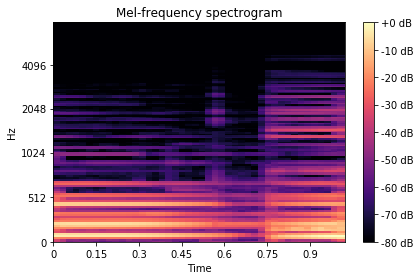

(128, 44)


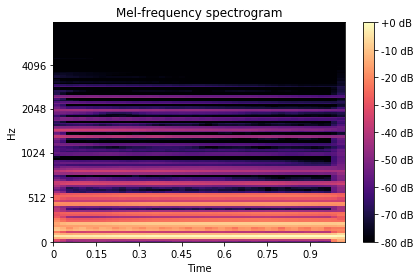

(128, 44)


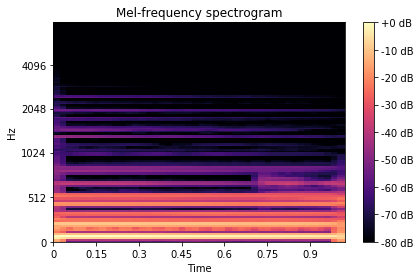

(128, 44)


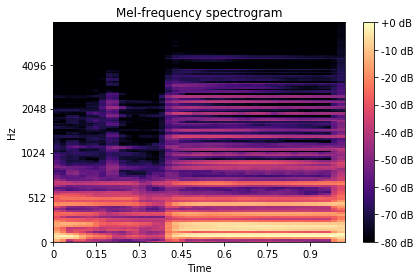

(128, 44)


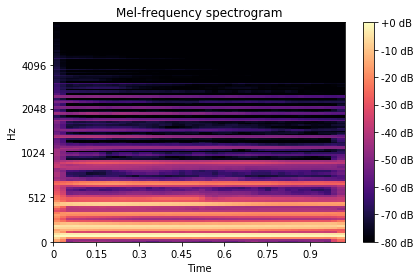

(128, 44)


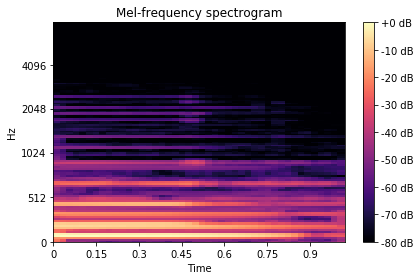

(128, 44)


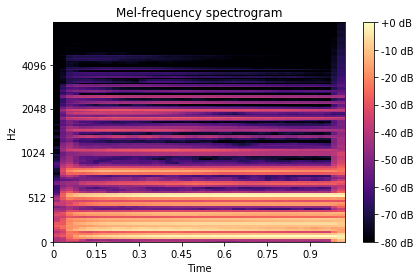

(128, 44)


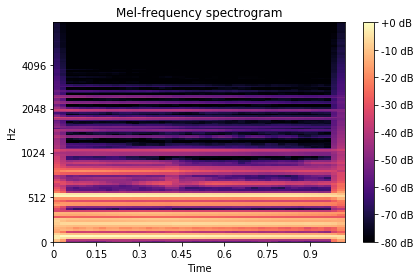

(128, 44)


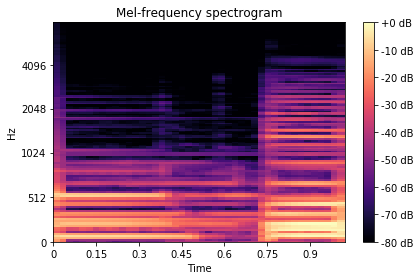

(128, 44)


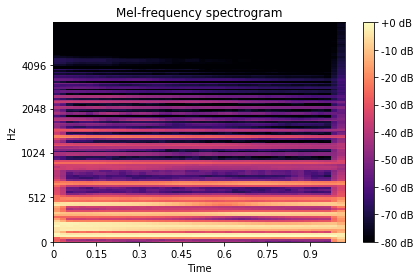

(128, 44)


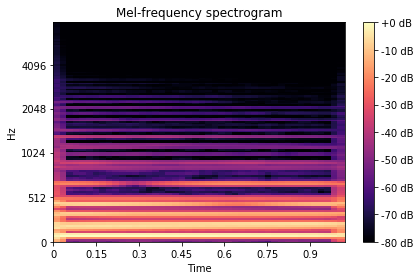

(128, 44)


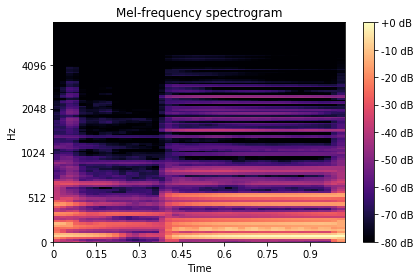

(128, 44)


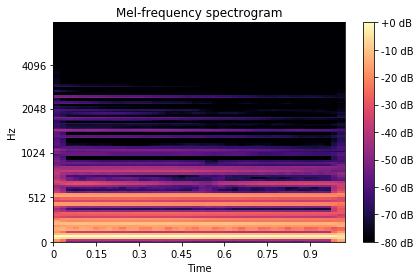

(128, 44)


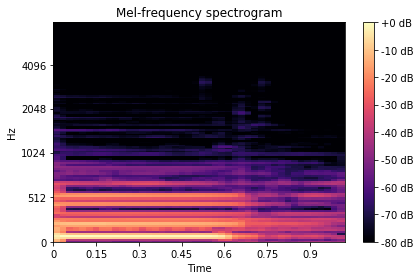

(128, 44)


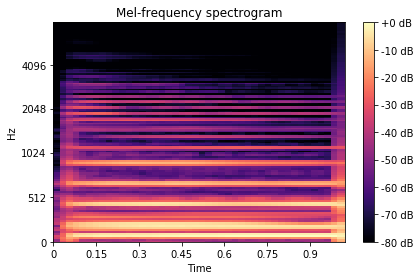

(128, 44)


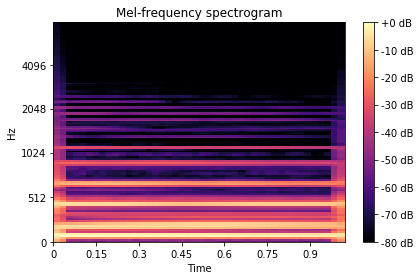

(128, 44)


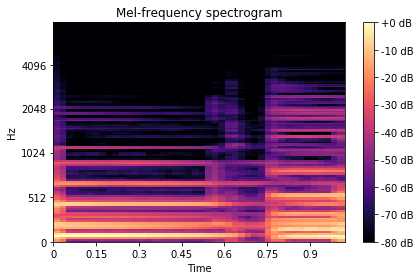

(128, 44)


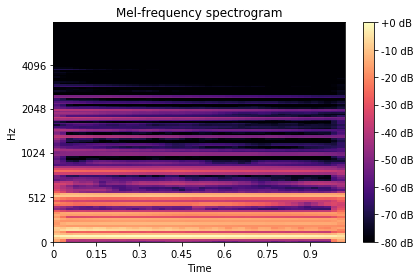

(128, 44)


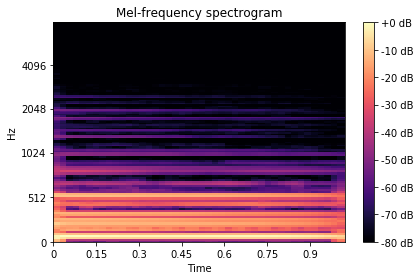

(128, 44)


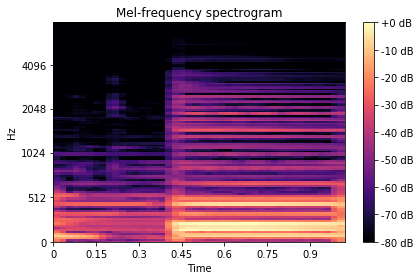

(128, 44)


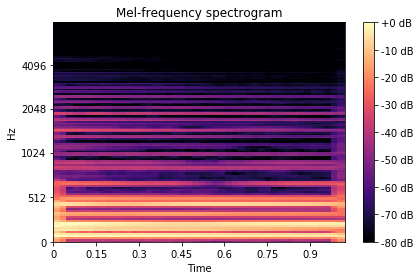

(128, 44)


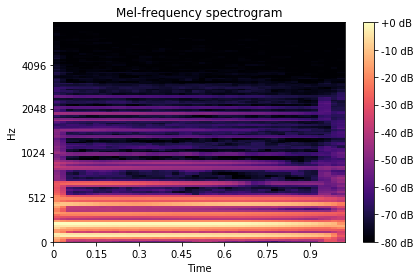

(128, 44)


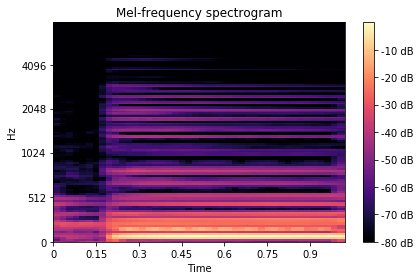

(128, 44)


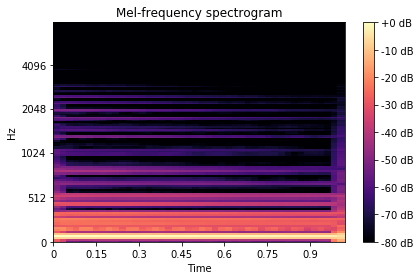

(128, 44)


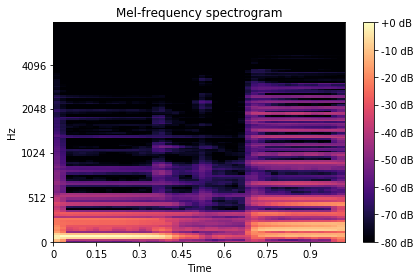

(128, 44)


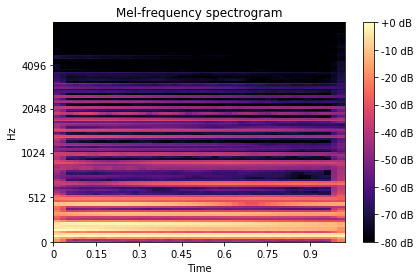

(128, 44)


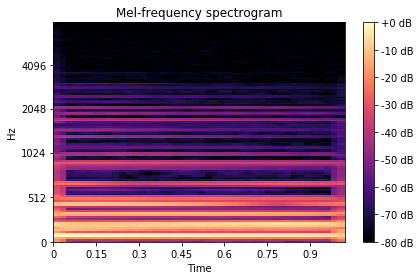

(128, 44)


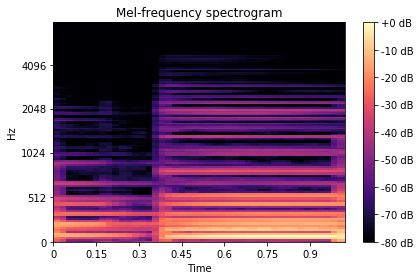

(128, 44)


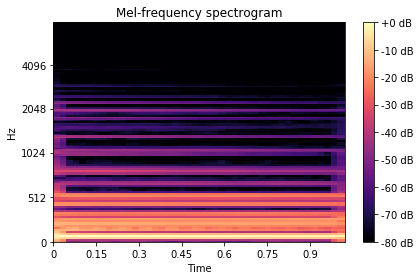

(128, 44)


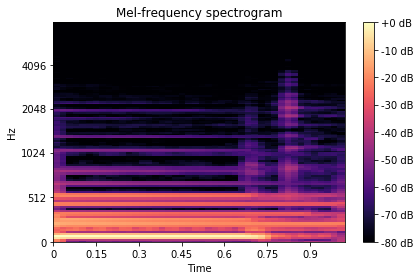

(128, 44)


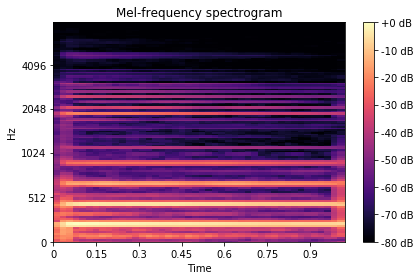

(128, 44)


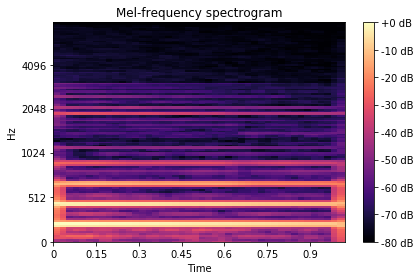

(128, 44)


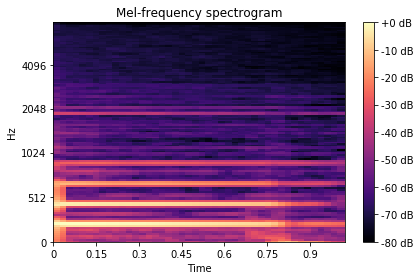

(128, 44)


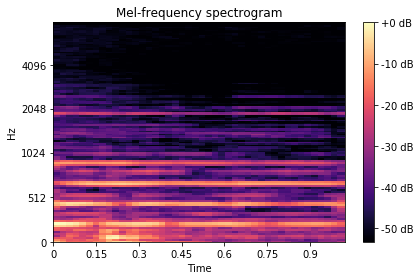

(128, 44)


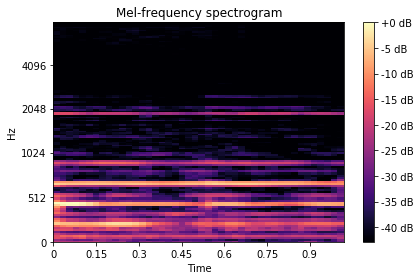

(128, 44)


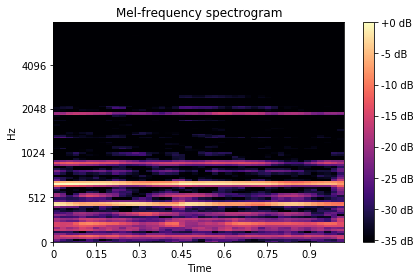

(128, 44)


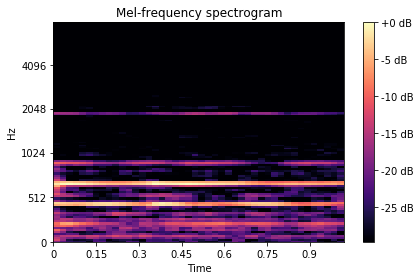

(128, 44)


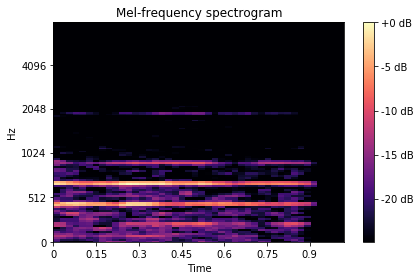

(128, 44)


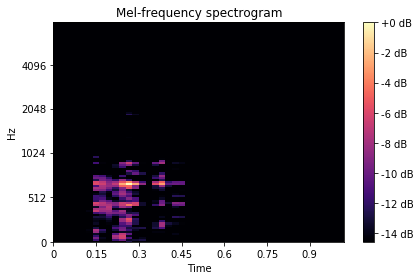

In [15]:
track = load_track('AmarLal_Rest')
preprocess_track(track, 1)

In [ ]:
instruments = medleydb.get_valid_instrument_labels()
instruments = list(instruments)
instruments.sort()
print(instruments)  

In [ ]:
print(track.source_id_fpath)

In [ ]:
track = load_track("MusicDelta_Punk")
print(track.source_id_fpath)
#play_audio(track)

In [ ]:
INSTRUMENTS = {"drum set", "electric bass", "male singer", 
               "distorted electric guitar", "clean electric guitar",
              "synthesizer", "acoustic guitar", "piano", "vocalist",
              "female singer", "string section","electric piano",
              "electric organ", "double bass", "cello", "violin",
              "tabla","flute"} 

INSTRUMENT_INDEX = {"drum set":0, "electric bass":1, "male singer":2, 
               "distorted electric guitar":3, "clean electric guitar":4,
              "synthesizer":5, "acoustic guitar":6, "piano":7, "vocalist":8,
              "female singer":9, "string section":10,"electric piano":11,
              "electric organ":12, "double bass":13, "cello":14, "violin":15,
              "tabla":16,"flute":17} 

def pre_process_spectrogram_labels(track, spectrogram_len=1):
    y, sr = librosa.load(track.mix_path)
    samples_per_spectrogram = int(sr*spectrogram_len)
    num_spectrograms = len(y)//samples_per_spectrogram
    time_cutoff = num_spectrograms*spectrogram_len
    print("time_cutoff: ", time_cutoff)
    print("#spectros: ", num_spectrograms, "\n")
    #Rows = which spectrogram, Cols = Which instrument
    instrument_annotations = np.zeros((num_spectrograms, len(INSTRUMENTS)))
    annotations = pd.read_csv(track.source_id_fpath)
    # BUG: Måste cutta bort alla tider som har cuttats bort med tanke på spec len
    # e.g: Om en låt är 33.5s och ett spectrogram är 1s, så försvinner 0.5, för det inte går jämnt ut. 
    for index, row in annotations.iterrows():
        instrument = row["instrument_label"]
        if instrument in INSTRUMENTS:
            s_t = row["start_time"]
            e_t = row["end_time"]
            if e_t > time_cutoff: 
                e_t = time_cutoff
            d_t = e_t - s_t
            s_i = int(s_t//spectrogram_len)
            e_i = int(e_t//spectrogram_len)
            #if s_t % spect_len == 0: 
            #    num_spec = int(d_t/spectrogram_len)
            #else: 
            #    num_spec = int(d_t/spectrogram_len) + 1
            print("instrument: ", instrument, "(%s)" % INSTRUMENT_INDEX[instrument])
            #print("start time: ", s_t)
            #print("end time: ", e_t)
            #print("delta time: ", d_t)
            print("start index: ", s_i)
            print("end index: ", e_i, "\n")
            ##print("num spectr: ", num_spec, "\n")
            
            for i in range(s_i, e_i):
                # print("i: ", i)
                # print("#spectros: ", num_spec)
                instrument_annotations[i][INSTRUMENT_INDEX[instrument]] = 1
    # np.set_printoptions(threshold=np.inf)
    # print(instrument_annotations)

In [ ]:
track = load_track("AimeeNorwich_Flying")
print(track.mix_path)
#play_audio(track)
pre_process_spectrogram_labels(track, 1)

In [ ]:
df = pre_process_spectrogram_labels(track)

In [ ]:
spect_len = 1
instrument_annotations = np.zeros((34, len(INSTRUMENTS)))
for index, row in df.iterrows():
    instrument = row["instrument_label"]
    if instrument in INSTRUMENTS:
        s_t = row["start_time"]
        e_t = row["end_time"]
        d_t = e_t - s_t
        s_i = s_t/spect_len
        if s_t % spect_len == 0: 
            num_spec = int(d_t/spect_len)
        else: 
            num_spec = int(d_t/spect_len) + 1
        s_i = int(s_i)
        for i in range(s_i, s_i+num_spec):
            instrument_annotations[i][INSTRUMENT_INDEX[instrument]] = 1
            
print(instrument_annotations)